The project is based on the dataset "Smart home dataset with weather information" (“Smart Home Dataset with Weather Information”).

Questions:
1) Predict the energy usage over time,

2) Predict the energy usage in a household depending on the weather conditions.

This dataset CSV file contains the readings with a time span of 1 minute of house appliances in kW from a smart meter and weather conditions of that particular region.

## Libraries and file upload

Importing libraries

In [1]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import seaborn as sns
sns.set(color_codes=True)

import matplotlib.pyplot as plt
%matplotlib inline

import time 

Setting Jupyter to see all columns and rows (instead of default truncated results for large datasets)

In [2]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [3]:
df=pd.read_csv("HomeC.csv")

# PART-1 Data Preparation

## 1) Dataset description

About the dataset:
The original dataset contains 503 911 rows and 32 columns.

Columns description (“Smart Home Dataset with Weather Information”):

* Index
time - Time of the readings, with a time span of 1 minute. In this dataset, time is recorded in the Unix Time format (Unix Time represents the number of seconds that have passed since 00:00:00 UTC Thursday, 1 January 1970)

* Energy Usage
use [kW] - Total energy consumption
gen [kW] - Total energy generated by means of solar or other power generation resources
House overall [kW] - overall house energy consumption
Dishwasher [kW] - energy consumed by specific appliance
Furnace 1 [kW] - energy consumed by specific appliance
Furnace 2 [kW] - energy consumed by specific appliance
Home office [kW] - energy consumed by specific appliance
Fridge [kW] - energy consumed by specific appliance
Wine cellar [kW] - energy consumed by specific appliance
Garage door [kW] - energy consumed by specific appliance
Kitchen 12 [kW] - energy consumption in kitchen 1
Kitchen 14 [kW]- energy consumption in kitchen 2
Kitchen 38 [kW]- energy consumption in kitchen 3
Barn [kW]- energy consumed by specific appliance
Well [kW]- energy consumed by specific appliance
Microwave [kW]- energy consumed by specific appliance
Living room [kW]- energy consumption in Living room
Solar [kW]- Solar power generation

*Weather
- temperature: Temperature is a physical quantity expressing hot and cold.
- humidity: Humidity is the concentration of water vapour present in air.
- visibility: Visibility sensors measure the meteorological optical range which is defined as the length of atmosphere over which a beam of light travels before its luminous flux is reduced to 5% of its original value.
- apparentTemperature: Apparent temperature is the temperature equivalent perceived by humans, caused by the combined effects of air temperature, relative humidity and wind speed. The measure is most commonly applied to the perceived outdoor temperature.
- pressure: Falling air pressure indicates that bad weather is coming, while rising air pressure indicates good weather
- windSpeed: Wind speed, or wind flow speed, is a fundamental atmospheric quantity caused by air moving from high to low pressure, usually due to changes in temperature.
- cloudCover: Cloud cover (also known as cloudiness, cloudage, or cloud amount) refers to the fraction of the sky obscured by clouds when observed from a particular location. Okta is the usual unit of measurement of the cloud cover.
- windBearing: In meteorology, an azimuth of 000° is used only when no wind is blowing, while 360° means the wind is from the North. True Wind Direction True North is represented on a globe as the North Pole. All directions relative to True North may be called "true bearings."
- dewPoint: the atmospheric temperature (varying according to pressure and humidity) below which water droplets begin to condense and dew can form.
- precipProbability: A probability of precipitation (POP), also referred to as chance of precipitation or chance of rain, is a measure of the probability that at least some minimum quantity of precipitation will occur within a specified forecast period and location.
- precipIntensity: The intensity of rainfall is a measure of the amount of rain that falls over time. The intensity of rain is measured in the height of the water layer covering the ground in a period of time. It means that if the rain stays where it falls, it would form a layer of a certain height.

*Other
- summary:
Report generated by the by the data collection system.
Including:
Clear, Mostly Cloudy, Overcast, Partly Cloudy, Drizzle,
 Light Rain, Rain, Light Snow, Flurries, Breezy, Snow,
 Rain and Breezy, Foggy, Breezy and Mostly Cloudy,
 Breezy and Partly Cloudy, Flurries and Breezy, Dry,
 Heavy, Snow.
 
- icon:
The icon that is used by the data collection system.
Including: cloudy, clear-night, partly-cloudy-night, clear-day, partly-cloudy-day, rain, snow, wind, fog.

In [4]:
df.head(10)

,time,use [kW],gen [kW],House overall [kW],Dishwasher [kW],Furnace 1 [kW],Furnace 2 [kW],Home office [kW],Fridge [kW],Wine cellar [kW],Garage door [kW],Kitchen 12 [kW],Kitchen 14 [kW],Kitchen 38 [kW],Barn [kW],Well [kW],Microwave [kW],Living room [kW],Solar [kW],temperature,icon,humidity,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability
0,1451624400,0.932833,0.003483,0.932833,0.000033,0.020700,0.061917,0.442633,0.124150,0.006983,0.013083,0.000417,0.000150,0.000000,0.031350,0.001017,0.004067,0.001517,0.003483,36.14,clear-night,0.62,10.0,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0,24.4,0.0
1,1451624401,0.934333,0.003467,0.934333,0.000000,0.020717,0.063817,0.444067,0.124000,0.006983,0.013117,0.000417,0.000150,0.000000,0.031500,0.001017,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.0,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0,24.4,0.0
2,1451624402,0.931817,0.003467,0.931817,0.000017,0.020700,0.062317,0.446067,0.123533,0.006983,0.013083,0.000433,0.000167,0.000017,0.031517,0.001000,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.0,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0,24.4,0.0
3,1451624403,1.022050,0.003483,1.022050,0.000017,0.106900,0.068517,0.446583,0.123133,0.006983,0.013000,0.000433,0.000217,0.000000,0.031500,0.001017,0.004067,0.001617,0.003483,36.14,clear-night,0.62,10.0,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0,24.4,0.0
4,1451624404,1.139400,0.003467,1.139400,0.000133,0.236933,0.063983,0.446533,0.122850,0.006850,0.012783,0.000450,0.000333,0.000000,0.031500,0.001017,0.004067,0.001583,0.003467,36.14,clear-night,0.62,10.0,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0,24.4,0.0
5,1451624405,1.391867,0.003433,1.391867,0.000283,0.503250,0.063667,0.447033,0.122300,0.006717,0.012433,0.000483,0.000567,0.000000,0.031450,0.001017,0.004067,0.001583,0.003433,36.14,clear-night,0.62,10.0,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0,24.4,0.0
6,1451624406,1.366217,0.003450,1.366217,0.000283,0.499400,0.063717,0.443267,0.122050,0.006733,0.012417,0.000517,0.000550,0.000000,0.031550,0.001033,0.004117,0.001533,0.003450,36.14,clear-night,0.62,10.0,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0,24.4,0.0
7,1451624407,1.431900,0.003417,1.431900,0.000250,0.477867,0.178633,0.444283,0.121800,0.006783,0.012550,0.000483,0.000450,0.000000,0.031733,0.001033,0.004200,0.001550,0.003417,36.14,clear-night,0.62,10.0,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0,24.4,0.0
8,1451624408,1.627300,0.003417,1.627300,0.000183,0.447650,0.365700,0.441467,0.121617,0.006950,0.012717,0.000467,0.000300,0.000017,0.031767,0.001017,0.004200,0.001567,0.003417,36.14,clear-night,0.62,10.0,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0,24.4,0.0
9,1451624409,1.735383,0.003417,1.735383,0.000017,0.171550,0.682500,0.438733,0.121633,0.007233,0.013350,0.000367,0.000050,0.000000,0.031667,0.001017,0.004200,0.001617,0.003417,36.14,clear-night,0.62,10.0,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0,24.4,0.0


In [5]:
df.shape

(503911, 32)

In [6]:
df.dtypes

time                    object
use [kW]               float64
gen [kW]               float64
House overall [kW]     float64
Dishwasher [kW]        float64
Furnace 1 [kW]         float64
Furnace 2 [kW]         float64
Home office [kW]       float64
Fridge [kW]            float64
Wine cellar [kW]       float64
Garage door [kW]       float64
Kitchen 12 [kW]        float64
Kitchen 14 [kW]        float64
Kitchen 38 [kW]        float64
Barn [kW]              float64
Well [kW]              float64
Microwave [kW]         float64
Living room [kW]       float64
Solar [kW]             float64
temperature            float64
icon                    object
humidity               float64
visibility             float64
summary                 object
apparentTemperature    float64
pressure               float64
windSpeed              float64
cloudCover              object
windBearing            float64
precipIntensity        float64
dewPoint               float64
precipProbability      float64
dtype: o

In [7]:
df.nunique()

time                   503911
use [kW]               130103
gen [kW]                29904
House overall [kW]     130103
Dishwasher [kW]          9595
Furnace 1 [kW]          28755
Furnace 2 [kW]          28700
Home office [kW]        23272
Fridge [kW]             13986
Wine cellar [kW]        10738
Garage door [kW]         4567
Kitchen 12 [kW]          2308
Kitchen 14 [kW]          7466
Kitchen 38 [kW]             9
Barn [kW]               19906
Well [kW]                6329
Microwave [kW]           4386
Living room [kW]         7342
Solar [kW]              29904
temperature              5063
icon                        9
humidity                   86
visibility                705
summary                    18
apparentTemperature      5295
pressure                 3017
windSpeed                1671
cloudCover                118
windBearing               360
precipIntensity           433
dewPoint                 4931
precipProbability          85
dtype: int64

In [8]:
df.describe()

,use [kW],gen [kW],House overall [kW],Dishwasher [kW],Furnace 1 [kW],Furnace 2 [kW],Home office [kW],Fridge [kW],Wine cellar [kW],Garage door [kW],Kitchen 12 [kW],Kitchen 14 [kW],Kitchen 38 [kW],Barn [kW],Well [kW],Microwave [kW],Living room [kW],Solar [kW],temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,windBearing,precipIntensity,dewPoint,precipProbability
count,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000
mean,0.858962,0.076229,0.858962,0.031368,0.099210,0.136779,0.081287,0.063556,0.042137,0.014139,0.002755,0.007023,0.000009,0.058530,0.015642,0.010983,0.035313,0.076229,50.741935,0.664085,9.253444,48.263382,1016.301625,6.649936,202.356843,0.002598,38.694013,0.056453
std,1.058207,0.128428,1.058207,0.190951,0.169059,0.178631,0.104466,0.076199,0.057967,0.014292,0.021860,0.076740,0.000010,0.202706,0.137841,0.098859,0.096056,0.128428,19.113807,0.194389,1.611186,22.027916,7.895185,3.982716,106.520474,0.011257,19.087939,0.165836
min,0.000000,0.000000,0.000000,0.000000,0.000017,0.000067,0.000083,0.000067,0.000017,0.000017,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-12.640000,0.130000,0.270000,-32.080000,986.400000,0.000000,0.000000,0.000000,-27.240000,0.000000
25%,0.367667,0.003367,0.367667,0.000000,0.020233,0.064400,0.040383,0.005083,0.007133,0.012733,0.000500,0.000017,0.000000,0.029833,0.000983,0.003617,0.001483,0.003367,35.770000,0.510000,9.420000,31.090000,1011.290000,3.660000,148.000000,0.000000,24.600000,0.000000
50%,0.562333,0.004283,0.562333,0.000017,0.020617,0.066633,0.042217,0.005433,0.008083,0.012933,0.000667,0.000050,0.000017,0.031317,0.001000,0.004000,0.001617,0.004283,50.320000,0.680000,10.000000,50.320000,1016.530000,5.930000,208.000000,0.000000,39.030000,0.000000
75%,0.970250,0.083917,0.970250,0.000233,0.068733,0.080633,0.068283,0.125417,0.053192,0.013100,0.000750,0.000167,0.000017,0.032883,0.001017,0.004067,0.001750,0.083917,66.260000,0.840000,10.000000,66.260000,1021.480000,8.940000,295.000000,0.000000,54.790000,0.000000
max,14.714567,0.613883,14.714567,1.401767,1.934083,0.794933,0.971750,0.851267,1.273933,1.088983,1.166583,2.262583,0.000183,7.027900,1.633017,1.929800,0.465217,0.613883,93.720000,0.980000,10.000000,101.120000,1042.460000,22.910000,359.000000,0.191000,75.490000,0.840000


## 2) Column names

Removing [kW] from column description

In [9]:
df.columns = [col.replace(' [kW]', '') for col in df.columns]

In [10]:
df.describe()

,use,gen,House overall,Dishwasher,Furnace 1,Furnace 2,Home office,Fridge,Wine cellar,Garage door,Kitchen 12,Kitchen 14,Kitchen 38,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,windBearing,precipIntensity,dewPoint,precipProbability
count,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000
mean,0.858962,0.076229,0.858962,0.031368,0.099210,0.136779,0.081287,0.063556,0.042137,0.014139,0.002755,0.007023,0.000009,0.058530,0.015642,0.010983,0.035313,0.076229,50.741935,0.664085,9.253444,48.263382,1016.301625,6.649936,202.356843,0.002598,38.694013,0.056453
std,1.058207,0.128428,1.058207,0.190951,0.169059,0.178631,0.104466,0.076199,0.057967,0.014292,0.021860,0.076740,0.000010,0.202706,0.137841,0.098859,0.096056,0.128428,19.113807,0.194389,1.611186,22.027916,7.895185,3.982716,106.520474,0.011257,19.087939,0.165836
min,0.000000,0.000000,0.000000,0.000000,0.000017,0.000067,0.000083,0.000067,0.000017,0.000017,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-12.640000,0.130000,0.270000,-32.080000,986.400000,0.000000,0.000000,0.000000,-27.240000,0.000000
25%,0.367667,0.003367,0.367667,0.000000,0.020233,0.064400,0.040383,0.005083,0.007133,0.012733,0.000500,0.000017,0.000000,0.029833,0.000983,0.003617,0.001483,0.003367,35.770000,0.510000,9.420000,31.090000,1011.290000,3.660000,148.000000,0.000000,24.600000,0.000000
50%,0.562333,0.004283,0.562333,0.000017,0.020617,0.066633,0.042217,0.005433,0.008083,0.012933,0.000667,0.000050,0.000017,0.031317,0.001000,0.004000,0.001617,0.004283,50.320000,0.680000,10.000000,50.320000,1016.530000,5.930000,208.000000,0.000000,39.030000,0.000000
75%,0.970250,0.083917,0.970250,0.000233,0.068733,0.080633,0.068283,0.125417,0.053192,0.013100,0.000750,0.000167,0.000017,0.032883,0.001017,0.004067,0.001750,0.083917,66.260000,0.840000,10.000000,66.260000,1021.480000,8.940000,295.000000,0.000000,54.790000,0.000000
max,14.714567,0.613883,14.714567,1.401767,1.934083,0.794933,0.971750,0.851267,1.273933,1.088983,1.166583,2.262583,0.000183,7.027900,1.633017,1.929800,0.465217,0.613883,93.720000,0.980000,10.000000,101.120000,1042.460000,22.910000,359.000000,0.191000,75.490000,0.840000


## 3) Data cleaning

Checking for duplicates - there are no duplicated rows

In [11]:
df.duplicated().sum()

0

Checking for NaN values - there is 1 NaN value in all columns, except time

In [12]:
df.isnull().sum()

time                   0
use                    1
gen                    1
House overall          1
Dishwasher             1
Furnace 1              1
Furnace 2              1
Home office            1
Fridge                 1
Wine cellar            1
Garage door            1
Kitchen 12             1
Kitchen 14             1
Kitchen 38             1
Barn                   1
Well                   1
Microwave              1
Living room            1
Solar                  1
temperature            1
icon                   1
humidity               1
visibility             1
summary                1
apparentTemperature    1
pressure               1
windSpeed              1
cloudCover             1
windBearing            1
precipIntensity        1
dewPoint               1
precipProbability      1
dtype: int64

We can see that all NaN values are in the row 503910. This row has no values other than NaN, so can be removed

In [13]:
table_NaN = df[df.isnull().sum(axis=1) >= 1] 
table_NaN

,time,use,gen,House overall,Dishwasher,Furnace 1,Furnace 2,Home office,Fridge,Wine cellar,Garage door,Kitchen 12,Kitchen 14,Kitchen 38,Barn,Well,Microwave,Living room,Solar,temperature,icon,humidity,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability
503910,\,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
df1=df.drop([503910],axis=0)

In [15]:
df1.shape

(503910, 32)

All NaN values have been cleaned

In [16]:
df1.isnull().sum()

time                   0
use                    0
gen                    0
House overall          0
Dishwasher             0
Furnace 1              0
Furnace 2              0
Home office            0
Fridge                 0
Wine cellar            0
Garage door            0
Kitchen 12             0
Kitchen 14             0
Kitchen 38             0
Barn                   0
Well                   0
Microwave              0
Living room            0
Solar                  0
temperature            0
icon                   0
humidity               0
visibility             0
summary                0
apparentTemperature    0
pressure               0
windSpeed              0
cloudCover             0
windBearing            0
precipIntensity        0
dewPoint               0
precipProbability      0
dtype: int64

Investigating the columns with non-numerical data.
There are 4 columns in object-format:
- Time
- icon
- summary
- cloudCover

Columns icon and summary contain categorical-value data collection - the columns will be removed.

In [17]:
df1.dtypes

time                    object
use                    float64
gen                    float64
House overall          float64
Dishwasher             float64
Furnace 1              float64
Furnace 2              float64
Home office            float64
Fridge                 float64
Wine cellar            float64
Garage door            float64
Kitchen 12             float64
Kitchen 14             float64
Kitchen 38             float64
Barn                   float64
Well                   float64
Microwave              float64
Living room            float64
Solar                  float64
temperature            float64
icon                    object
humidity               float64
visibility             float64
summary                 object
apparentTemperature    float64
pressure               float64
windSpeed              float64
cloudCover              object
windBearing            float64
precipIntensity        float64
dewPoint               float64
precipProbability      float64
dtype: o

In [18]:
df1.drop(columns=["icon","summary"], inplace=True)

In [19]:
df1.dtypes

time                    object
use                    float64
gen                    float64
House overall          float64
Dishwasher             float64
Furnace 1              float64
Furnace 2              float64
Home office            float64
Fridge                 float64
Wine cellar            float64
Garage door            float64
Kitchen 12             float64
Kitchen 14             float64
Kitchen 38             float64
Barn                   float64
Well                   float64
Microwave              float64
Living room            float64
Solar                  float64
temperature            float64
humidity               float64
visibility             float64
apparentTemperature    float64
pressure               float64
windSpeed              float64
cloudCover              object
windBearing            float64
precipIntensity        float64
dewPoint               float64
precipProbability      float64
dtype: object

Investigating column "cloudCover" - this column contains text "cloudCover" in place of NaN values. There are 58 rows with this invalid value in the column "cloudCover" - this is very small number of rows (58 values in 503910 Total row) - I will use median to fill these NaNs.
Once all values are numerical, I will change the data type to float64.

In [20]:
df1["cloudCover"].unique()

array(['cloudCover', '0.75', '0', '1', '0.31', '0.44', '0.13', '0.19',
       '0.25', '0.16', '0.21', '0.15', '0.14', '0.27', '0.28', '0.17',
       '0.05', '0.1', '0.26', '0.29', '0.11', '0.09', '0.12', '0.06',
       '0.02', '0.08', '0.04', '0.35', '0.22', '0.23', '0.54', '0.39',
       '0.03', '0.07', '0.76', '0.62', '0.18', '0.79', '0.48', '0.24',
       '0.57', 0.24, 1.0, 0.31, 0.28, 0.15, 0.41, 0.1, 0.12, 0.08, 0.09,
       0.19, 0.04, 0.05, 0.29, 0.27, 0.35, 0.18, 0.06, 0.03, 0.11, 0.14,
       0.25, 0.78, 0.0, 0.16, 0.21, 0.23, 0.17, 0.75, 0.26, 0.2, 0.76,
       0.13, 0.77, 0.46, 0.07, 0.55, 0.02, 0.01, 0.51, 0.47, 0.5, 0.4,
       0.3, 0.22, 0.43, 0.33, 0.6, 0.68, 0.66, 0.45, 0.34, 0.52, 0.67,
       0.48, 0.49, 0.39, 0.37, 0.62, 0.36, 0.79, 0.61, 0.38, 0.42, 0.53,
       0.63, 0.44, 0.54, 0.32, 0.56, 0.58, 0.72, 0.57, 0.73, 0.71, 0.64,
       0.59], dtype=object)

In [21]:
df1.shape

(503910, 30)

In [22]:
df1[df1["cloudCover"]=="cloudCover"].shape

(58, 30)

In [23]:
df1["cloudCover"].replace(["cloudCover"], np.NaN, inplace=True)
df1.isnull().sum()

time                    0
use                     0
gen                     0
House overall           0
Dishwasher              0
Furnace 1               0
Furnace 2               0
Home office             0
Fridge                  0
Wine cellar             0
Garage door             0
Kitchen 12              0
Kitchen 14              0
Kitchen 38              0
Barn                    0
Well                    0
Microwave               0
Living room             0
Solar                   0
temperature             0
humidity                0
visibility              0
apparentTemperature     0
pressure                0
windSpeed               0
cloudCover             58
windBearing             0
precipIntensity         0
dewPoint                0
precipProbability       0
dtype: int64

In [24]:
df1["cloudCover"]=df1["cloudCover"].fillna(df1["cloudCover"].median())

In [25]:
df1.isnull().sum()

time                   0
use                    0
gen                    0
House overall          0
Dishwasher             0
Furnace 1              0
Furnace 2              0
Home office            0
Fridge                 0
Wine cellar            0
Garage door            0
Kitchen 12             0
Kitchen 14             0
Kitchen 38             0
Barn                   0
Well                   0
Microwave              0
Living room            0
Solar                  0
temperature            0
humidity               0
visibility             0
apparentTemperature    0
pressure               0
windSpeed              0
cloudCover             0
windBearing            0
precipIntensity        0
dewPoint               0
precipProbability      0
dtype: int64

In [26]:
df1["cloudCover"] = df1["cloudCover"].astype("float")

## 4) Feature engineering

### Aggregating columns

In [27]:
# create aggregated columns with sum of information of furnaces and kitchens
df1['Furnace'] = df1[['Furnace 1','Furnace 2']].sum(axis=1)
df1['Kitchen'] = df1[['Kitchen 12','Kitchen 14','Kitchen 38']].sum(axis=1)
df1.drop(['Furnace 1','Furnace 2','Kitchen 12','Kitchen 14','Kitchen 38'], axis=1, inplace=True)

### Dealing with time

Time column shows time of measurements in Unix Time format

In [28]:
# find starting time

print("start", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(int(df1['time'].iloc[0]))))

start 2016-01-01 05:00:00


In [29]:
# Convert Unix Time to format "%Y-%m-%d %H:%M:%S", assigning 1minute intervals between measurements

time_index = pd.date_range('2016-01-01 05:00', periods=len(df1),  freq='min')  
time_index = pd.DatetimeIndex(time_index)
df1 = df1.set_index(time_index)

In [30]:
# Create a new column "time" that will allow us to extract information related to time. 

df1['time'] = pd.DatetimeIndex(pd.date_range('2016-01-01 05:00', periods=len(df1),  freq='min'))
df1.head()

,time,use,gen,House overall,Dishwasher,Home office,Fridge,Wine cellar,Garage door,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,Kitchen
2016-01-01 05:00:00,2016-01-01 05:00:00,0.932833,0.003483,0.932833,0.000033,0.442633,0.124150,0.006983,0.013083,0.031350,0.001017,0.004067,0.001517,0.003483,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.082617,0.000567
2016-01-01 05:01:00,2016-01-01 05:01:00,0.934333,0.003467,0.934333,0.000000,0.444067,0.124000,0.006983,0.013117,0.031500,0.001017,0.004067,0.001650,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.084533,0.000567
2016-01-01 05:02:00,2016-01-01 05:02:00,0.931817,0.003467,0.931817,0.000017,0.446067,0.123533,0.006983,0.013083,0.031517,0.001000,0.004067,0.001650,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.083017,0.000617
2016-01-01 05:03:00,2016-01-01 05:03:00,1.022050,0.003483,1.022050,0.000017,0.446583,0.123133,0.006983,0.013000,0.031500,0.001017,0.004067,0.001617,0.003483,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.175417,0.000650
2016-01-01 05:04:00,2016-01-01 05:04:00,1.139400,0.003467,1.139400,0.000133,0.446533,0.122850,0.006850,0.012783,0.031500,0.001017,0.004067,0.001583,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.300917,0.000783


In [31]:
#create separate columns from the time index

df1['year'] = df1['time'].apply(lambda x : x.year)
df1['month'] = df1['time'].apply(lambda x : x.month)
df1['day'] = df1['time'].apply(lambda x : x.day)
df1['week day'] = df1['time'].apply(lambda x : x.day_name())
df1['week of year'] = df1['time'].apply(lambda x : x.weekofyear)
df1['hour'] = df1['time'].apply(lambda x : x.hour)
df1['minute'] = df1['time'].apply(lambda x : x.minute)
df1.head()

,time,use,gen,House overall,Dishwasher,Home office,Fridge,Wine cellar,Garage door,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,Kitchen,year,month,day,week day,week of year,hour,minute
2016-01-01 05:00:00,2016-01-01 05:00:00,0.932833,0.003483,0.932833,0.000033,0.442633,0.124150,0.006983,0.013083,0.031350,0.001017,0.004067,0.001517,0.003483,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.082617,0.000567,2016,1,1,Friday,53,5,0
2016-01-01 05:01:00,2016-01-01 05:01:00,0.934333,0.003467,0.934333,0.000000,0.444067,0.124000,0.006983,0.013117,0.031500,0.001017,0.004067,0.001650,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.084533,0.000567,2016,1,1,Friday,53,5,1
2016-01-01 05:02:00,2016-01-01 05:02:00,0.931817,0.003467,0.931817,0.000017,0.446067,0.123533,0.006983,0.013083,0.031517,0.001000,0.004067,0.001650,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.083017,0.000617,2016,1,1,Friday,53,5,2
2016-01-01 05:03:00,2016-01-01 05:03:00,1.022050,0.003483,1.022050,0.000017,0.446583,0.123133,0.006983,0.013000,0.031500,0.001017,0.004067,0.001617,0.003483,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.175417,0.000650,2016,1,1,Friday,53,5,3
2016-01-01 05:04:00,2016-01-01 05:04:00,1.139400,0.003467,1.139400,0.000133,0.446533,0.122850,0.006850,0.012783,0.031500,0.001017,0.004067,0.001583,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.300917,0.000783,2016,1,1,Friday,53,5,4


In [32]:
#definitions to further clarify time of day or night

def hours2timeofday(x):
    if x in [22,23,0,1,2,3]:
        timing = 'Night'
    elif x in range(4, 12):
        timing = 'Morning'
    elif x in range(12, 17):
        timing = 'Afternoon'
    elif x in range(17, 22):
        timing = 'Evening'
    else:
        timing = 'X'
    return timing

In [33]:
df1['time of day'] = df1['hour'].apply(hours2timeofday)
df1.head()

,time,use,gen,House overall,Dishwasher,Home office,Fridge,Wine cellar,Garage door,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,Kitchen,year,month,day,week day,week of year,hour,minute,time of day
2016-01-01 05:00:00,2016-01-01 05:00:00,0.932833,0.003483,0.932833,0.000033,0.442633,0.124150,0.006983,0.013083,0.031350,0.001017,0.004067,0.001517,0.003483,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.082617,0.000567,2016,1,1,Friday,53,5,0,Morning
2016-01-01 05:01:00,2016-01-01 05:01:00,0.934333,0.003467,0.934333,0.000000,0.444067,0.124000,0.006983,0.013117,0.031500,0.001017,0.004067,0.001650,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.084533,0.000567,2016,1,1,Friday,53,5,1,Morning
2016-01-01 05:02:00,2016-01-01 05:02:00,0.931817,0.003467,0.931817,0.000017,0.446067,0.123533,0.006983,0.013083,0.031517,0.001000,0.004067,0.001650,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.083017,0.000617,2016,1,1,Friday,53,5,2,Morning
2016-01-01 05:03:00,2016-01-01 05:03:00,1.022050,0.003483,1.022050,0.000017,0.446583,0.123133,0.006983,0.013000,0.031500,0.001017,0.004067,0.001617,0.003483,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.175417,0.000650,2016,1,1,Friday,53,5,3,Morning
2016-01-01 05:04:00,2016-01-01 05:04:00,1.139400,0.003467,1.139400,0.000133,0.446533,0.122850,0.006850,0.012783,0.031500,0.001017,0.004067,0.001583,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.300917,0.000783,2016,1,1,Friday,53,5,4,Morning


# PART-2 Data visualisation and problem understanding

## 1) Visualisations over time

Temperature (daily average)

Note - temperature range in Celsius from -25 to 33

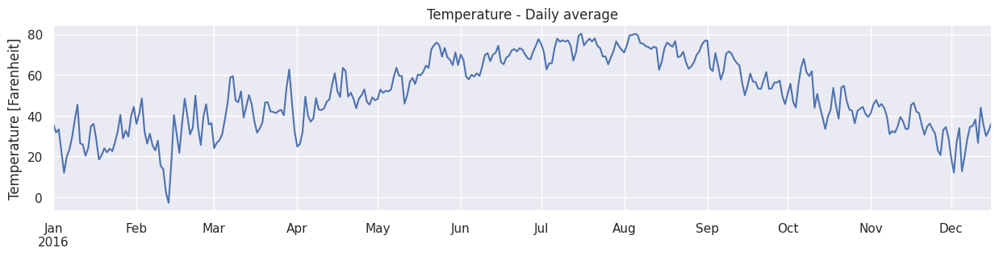

In [34]:
df1["temperature"].resample(rule='D').mean().plot(figsize=(15,3))
plt.title('Temperature - Daily average')
plt.ylabel("Temperature [Farenheit]");

House overall energy consumption - daily average (kW)

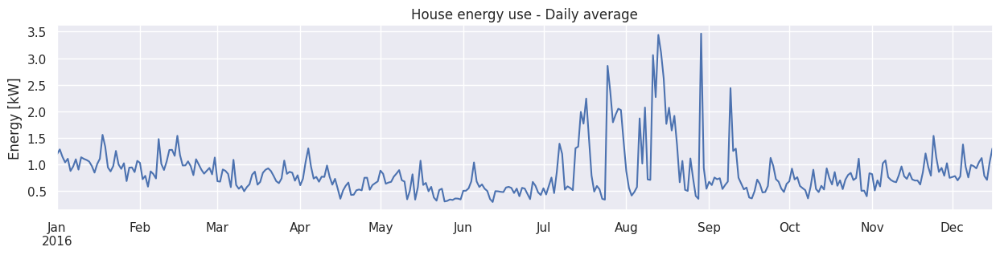

In [35]:
df1["House overall"].resample(rule='D').mean().plot(figsize=(15,3))
plt.title('House energy use - Daily average')
plt.ylabel("Energy [kW]");

Solar overall energy generation - daily average (kW)

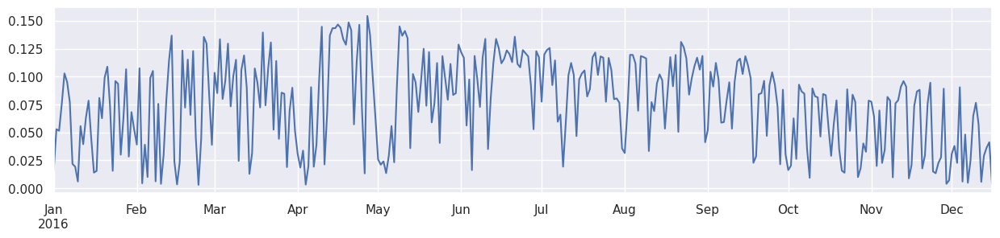

In [36]:
df1["Solar"].resample(rule='D').mean().plot(figsize=(15,3));

Solar overall energy generation vs Cloud cover - daily average (Energy in kW, Cloud cover in Okta)

We can observe that in some days when the Cloud cover peaks, then Solar drops

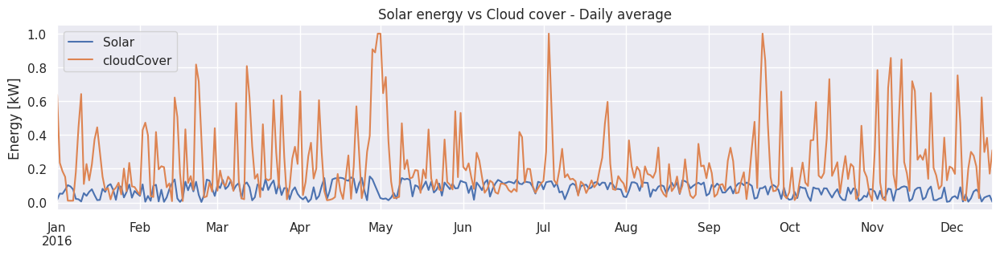

In [37]:
df1.resample(rule='D').mean().plot(y=["Solar", "cloudCover"],figsize=(15,3))

plt.title('Solar energy vs Cloud cover - Daily average')
plt.ylabel("Energy [kW]");

Why energy use in House overall spikes in July-Sep?

Furnace heating system is used as airconditioning during the summer. Also, Fridge and Wine cellar increase Energy use in the summer.

Showing Fridge and Wine cellar energy use increase in the summer

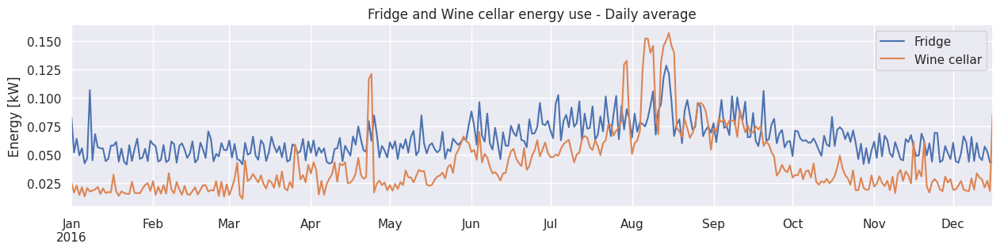

In [38]:
df1.resample(rule='D').mean().plot(y=["Fridge","Wine cellar"],figsize=(15,3))

plt.title('Fridge and Wine cellar energy use - Daily average')
plt.ylabel("Energy [kW]");

Checking Furnaces

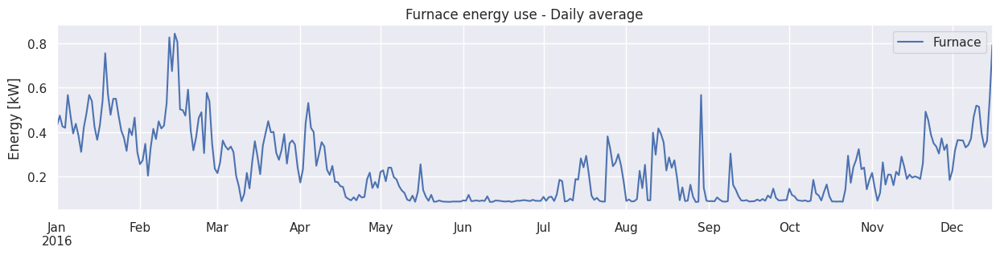

In [39]:
df1.resample(rule='D').mean().plot(y=["Furnace"],figsize=(15,3))
plt.title('Furnace energy use - Daily average')
plt.ylabel("Energy [kW]");

## 2) Energy use and generation on the average day

In [40]:
df_hour= df1.groupby("hour", axis = 0).mean()
df_hour.head(10)

,use,gen,House overall,Dishwasher,Home office,Fridge,Wine cellar,Garage door,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,Kitchen,year,month,day,week of year,minute
hour,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1.216527,0.003463,1.216527,0.030700,0.125363,0.075706,0.047457,0.014015,0.060251,0.016867,0.026114,0.043408,0.003463,50.996515,0.661120,9.310789,48.609975,1016.349973,6.624074,0.214228,200.687429,0.002455,38.687372,0.052607,0.250601,0.019783,2016.0,6.294286,15.445714,25.517143,29.500000
1,1.244789,0.003561,1.244789,0.060167,0.227679,0.077509,0.044144,0.013821,0.048716,0.016866,0.010895,0.037144,0.003561,51.062692,0.659498,9.300936,48.654618,1016.345524,6.721726,0.217751,202.615333,0.002425,38.587225,0.051858,0.257047,0.023678,2016.0,6.294286,15.445714,25.517143,29.500000
2,1.180794,0.003544,1.180794,0.070776,0.237340,0.073399,0.038316,0.014077,0.044320,0.015239,0.009007,0.023399,0.003544,51.091007,0.657592,9.296532,48.649010,1016.328973,6.701620,0.213584,199.481333,0.002382,38.490058,0.052148,0.197831,0.015487,2016.0,6.294286,15.445714,25.517143,29.500000
3,1.019734,0.003511,1.019734,0.078142,0.129432,0.072747,0.036043,0.013481,0.040565,0.016013,0.007130,0.015856,0.003511,51.129177,0.655948,9.297605,48.663071,1016.318339,6.722775,0.212972,204.734526,0.002172,38.467455,0.054336,0.161021,0.003479,2016.0,6.286123,15.444921,25.482117,29.478541
4,0.801882,0.003525,0.801882,0.061278,0.064270,0.067963,0.036721,0.013158,0.037369,0.007638,0.004092,0.006815,0.003525,51.066740,0.655343,9.307425,48.614630,1016.313524,6.759501,0.208853,199.742025,0.002118,38.412409,0.052415,0.177568,0.003170,2016.0,6.277937,15.444126,25.446991,29.500000
5,0.667460,0.003535,0.667460,0.019923,0.049835,0.066489,0.036045,0.013148,0.035193,0.001906,0.003883,0.002296,0.003535,50.855648,0.658080,9.253994,48.405648,1016.327711,6.674883,0.219530,204.598333,0.001939,38.374244,0.050435,0.201163,0.003077,2016.0,6.262857,15.402857,25.525714,29.500000
6,0.639028,0.003531,0.639028,0.003037,0.047007,0.058850,0.038624,0.013149,0.034869,0.001564,0.003832,0.001743,0.003531,50.704478,0.662038,9.204634,48.222619,1016.325065,6.677101,0.234384,203.354619,0.002207,38.434504,0.051548,0.223830,0.003080,2016.0,6.262857,15.402857,25.525714,29.500000
7,0.631712,0.003524,0.631712,0.000094,0.046159,0.053234,0.034877,0.013195,0.034214,0.001764,0.003834,0.001726,0.003524,50.636640,0.664729,9.192962,48.121230,1016.317664,6.700630,0.232060,201.709810,0.003054,38.534478,0.058027,0.237324,0.003209,2016.0,6.262857,15.402857,25.525714,29.500000
8,0.629537,0.003524,0.629537,0.000096,0.046164,0.052020,0.033433,0.013160,0.036662,0.001683,0.003870,0.001714,0.003524,50.642865,0.665332,9.199405,48.083586,1016.302503,6.752075,0.233033,202.024333,0.003958,38.641935,0.062823,0.244396,0.003201,2016.0,6.262857,15.402857,25.525714,29.500000


House overall has the highest energy usage at night (gradual increase after 6pm, and gradual decrease after 2am). The second energy increase is late morning (10-12).

Setting up the devices to use energy at night is probably due to lower energy prices at night and savings opportunities.

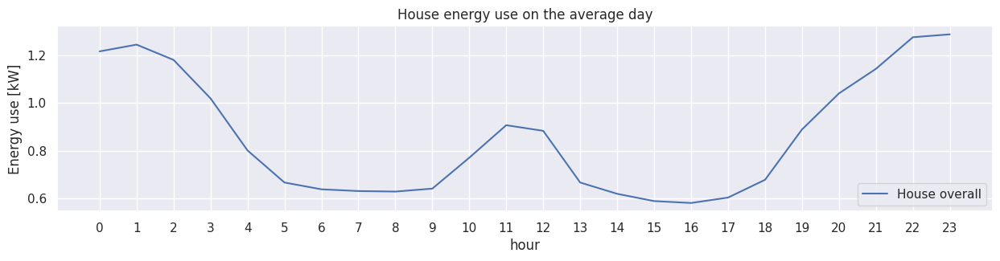

In [41]:
df_hour.plot(y=["House overall"],figsize=(15,3))
plt.xticks(np.arange(0, 24, step=1))

plt.legend(loc="lower right")

plt.title('House energy use on the average day')
plt.ylabel("Energy use [kW]");

Furnace energy use picks late morning (9-12am)

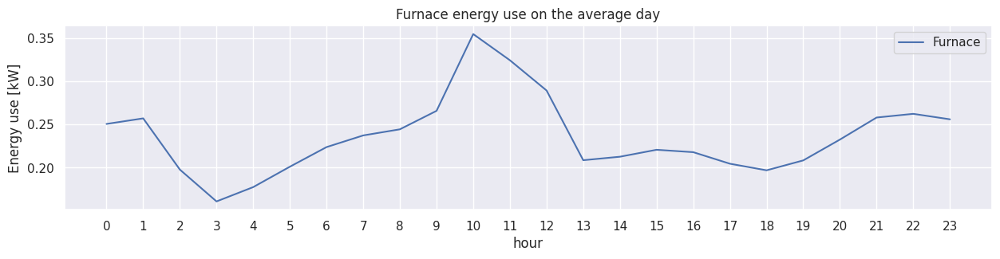

In [42]:
df_hour.plot(y=["Furnace"],figsize=(15,3))
plt.xticks(np.arange(0, 24, step=1))

plt.title('Furnace energy use on the average day')
plt.ylabel("Energy use [kW]");

Dishwasher energy increase after lunch time (13-20) and at night (1-4am).

This is probably due to washing the dishes after lunch time, and then setting up the second run of dishwasher during the night for energy costs savings

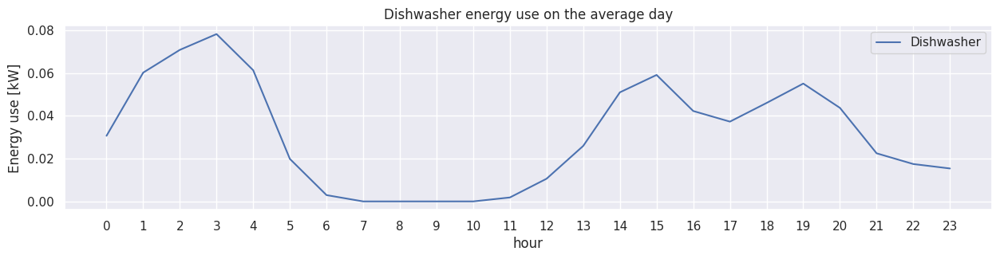

In [43]:
df_hour.plot(y=["Dishwasher"],figsize=(15,3))
plt.xticks(np.arange(0, 24, step=1))

plt.title('Dishwasher energy use on the average day')
plt.ylabel("Energy use [kW]");

Living room energy use is highest at lunch time (10-13) and late evening (9-11pm) - as expected

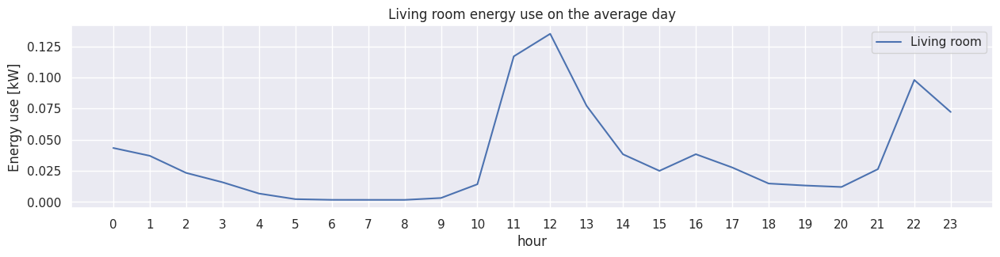

In [44]:
df_hour.plot(y=["Living room"],figsize=(15,3))
plt.xticks(np.arange(0, 24, step=1))

plt.title('Living room energy use on the average day')
plt.ylabel("Energy use [kW]");

Interestingly, home office energy use picks at night (1-2am).

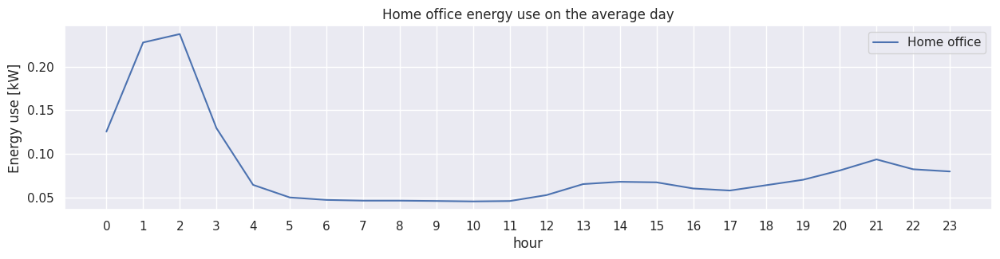

In [45]:
df_hour.plot(y=["Home office"],figsize=(15,3))
plt.xticks(np.arange(0, 24, step=1))

plt.title('Home office energy use on the average day')
plt.ylabel("Energy use [kW]");

Solar energy generation is highest between 12 and 22 - which is expected (hours with most sunshine)

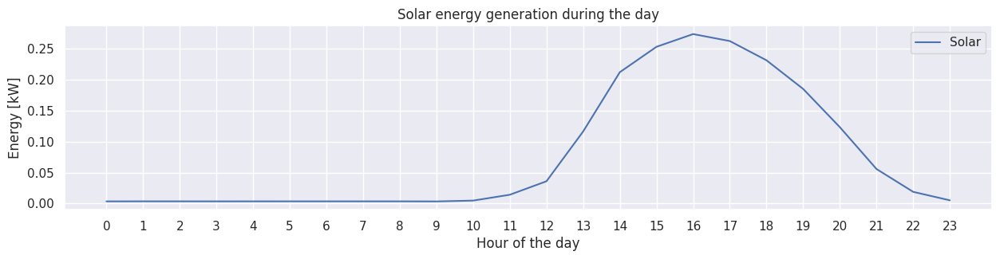

In [46]:
df_hour.plot(y=["Solar"],figsize=(15,3))
plt.xticks(np.arange(0, 24, step=1))

plt.title('Solar energy generation during the day')
plt.xlabel("Hour of the day")
plt.ylabel("Energy [kW]");

## 3) House energy use by Appliance

The pie chart below shows split of House overall energy use by appliance. We can observe that Top3 appliances for energy use are:
1) Furnaces (39.4% of House energy use)
2) Home office (13.6% of House energy use)
3) Fridge (10.6% of House energy use)

In [47]:
# selecting all appliances for visualisation

df_appliances=df1[["Dishwasher","Home office","Fridge","Wine cellar","Garage door","Barn","Well","Microwave","Living room","Furnace","Kitchen"]]

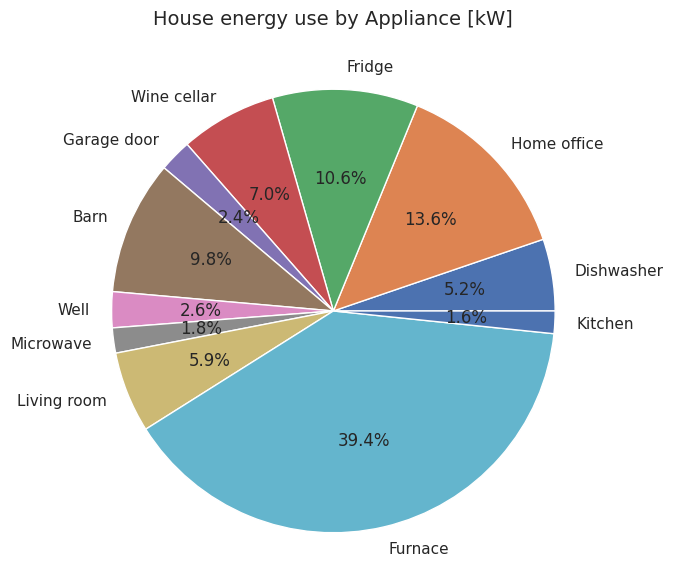

In [48]:
# pie chart to split House overall energy use by appliance
plt.figure(figsize=(8, 6))

df_appliances.sum().plot(kind='pie', radius=1.2, autopct='%1.1f%%', shadow = False)

plt.title('House energy use by Appliance [kW]',fontsize=14,pad=40);

In [49]:
df_appliances.sum().sort_values(ascending=False) 

Furnace        118917.457954
Home office     40961.277962
Fridge          32026.710600
Barn            29493.633696
Wine cellar     21233.079320
Living room     17794.476716
Dishwasher      15806.409510
Well             7882.163852
Garage door      7124.847316
Microwave        5534.440218
Kitchen          4932.186582
dtype: float64

## 4) Checking for correlations

1) Heat map

,use,gen,House overall,Dishwasher,Home office,Fridge,Wine cellar,Garage door,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,Kitchen,year,month,day,week of year,hour,minute
use,1.000000,-0.131635,1.000000,0.196272,0.147520,0.149223,0.124506,0.026531,0.196339,0.157281,0.114817,0.200350,-0.131635,0.010379,0.011511,-0.002609,0.005560,0.010730,-0.003853,-0.033513,0.011183,0.024836,0.016040,-0.003317,0.513503,0.103777,NaN,-0.003207,0.007126,0.007698,0.005240,-0.000313
gen,-0.131635,1.000000,-0.131635,0.038204,-0.085421,-0.002862,0.062430,0.036328,0.036456,0.025112,0.000375,-0.047849,1.000000,0.090983,0.007608,-0.017650,0.093793,-0.000222,-0.056554,0.000806,-0.007882,0.030447,0.089664,0.041192,-0.082863,-0.017690,NaN,-0.038014,0.038253,-0.042881,0.410571,0.000239
House overall,1.000000,-0.131635,1.000000,0.196272,0.147520,0.149223,0.124506,0.026531,0.196339,0.157281,0.114817,0.200350,-0.131635,0.010379,0.011511,-0.002609,0.005560,0.010730,-0.003853,-0.033513,0.011183,0.024836,0.016040,-0.003317,0.513503,0.103777,NaN,-0.003207,0.007126,0.007698,0.005240,-0.000313
Dishwasher,0.196272,0.038204,0.196272,1.000000,0.065525,0.034020,-0.004619,-0.008958,0.006914,0.008316,-0.001197,0.000612,0.038204,-0.015716,-0.001868,-0.008064,-0.014547,0.000211,-0.001672,-0.002354,0.004016,0.006265,-0.016099,0.008189,-0.004197,0.003272,NaN,-0.003923,-0.013282,-0.000919,-0.015590,0.001156
Home office,0.147520,-0.085421,0.147520,0.065525,1.000000,0.035013,0.003896,-0.013537,-0.038479,-0.006467,-0.007923,-0.052402,-0.085421,0.011908,-0.006008,0.020638,0.010856,0.027091,-0.017898,-0.040305,0.012427,-0.029890,0.007594,-0.032861,-0.017735,0.007517,NaN,0.031268,-0.022400,0.036426,-0.196688,0.000381
Fridge,0.149223,-0.002862,0.149223,0.034020,0.035013,1.000000,0.076183,-0.002380,-0.002205,0.010579,0.025698,0.054008,-0.002862,0.107466,0.030749,0.009019,0.107064,-0.000517,-0.024886,-0.023414,-0.008589,0.014253,0.115169,0.004794,-0.047486,0.011322,NaN,0.048400,0.000145,0.048954,-0.023261,0.002344
Wine cellar,0.124506,0.062430,0.124506,-0.004619,0.003896,0.076183,1.000000,0.004393,0.006372,0.006686,0.013267,0.033997,0.062430,0.289168,0.055541,0.030095,0.288882,0.018494,-0.052860,-0.040557,-0.025930,0.016588,0.298207,0.006571,-0.093372,0.005218,NaN,0.134409,0.027662,0.125140,0.076454,0.000860
Garage door,0.026531,0.036328,0.026531,-0.008958,-0.013537,-0.002380,0.004393,1.000000,0.017447,0.005698,-0.002093,0.004466,0.036328,0.013511,-0.007399,0.002262,0.013578,-0.000276,0.000419,-0.007440,0.012327,-0.006941,0.008350,-0.006639,-0.012138,-0.000467,NaN,0.012905,-0.000984,0.011165,0.042341,-0.004231
Barn,0.196339,0.036456,0.196339,0.006914,-0.038479,-0.002205,0.006372,0.017447,1.000000,0.002568,0.002386,-0.007774,0.036456,-0.017188,-0.002141,0.008376,-0.015189,0.011716,-0.015196,-0.011614,0.006255,-0.007258,-0.016738,-0.006063,-0.004299,-0.007801,NaN,-0.024798,-0.012976,-0.019872,0.100305,-0.002606
Well,0.157281,0.025112,0.157281,0.008316,-0.006467,0.010579,0.006686,0.005698,0.002568,1.000000,0.005573,0.078899,0.025112,-0.004691,-0.006590,-0.001069,-0.004741,0.002994,0.000677,-0.003003,0.004085,-0.004377,-0.007346,-0.002788,0.020702,0.021382,NaN,-0.003110,-0.006926,-0.001782,0.024303,-0.004448


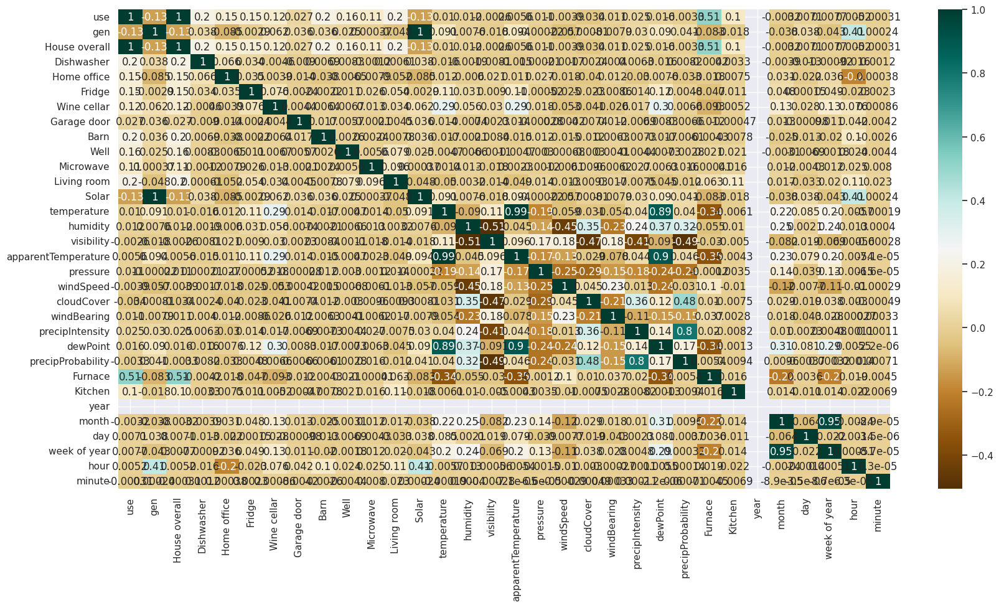

In [50]:
plt.figure(figsize=(20,10))
c= df1.corr()
sns.heatmap(c,cmap="BrBG",annot=True)
c

The heat map shows strict relationship =1 between columns "use" and "House overall". 
This means that Total energy consumption (column "use") is the same as Overall house energy consumption (column "House overall").
We can remove one of these columns as they present the same data - I will remove column "use";

The heat map also shows strict relationship =1 between columns "gen and "Solar". 
This means that Total energy generated (column "gen") comes from Solar power generation (column "Solar").
We can remove one of these columns as they present the same data - I will remove column "gen";

In the area of Weather affecting Appliances energy usage, we observe low correlation:
- House overall shows no evident correlation to any of the weather features.
- Furnace - small negative correlation with temperature (-0.34), apparent Temperature (-0.35) and dewPoint (-0.34)
- Fridge - small positive correlation with temperature (0.11), apparent Temperature (0.11) and dewPoint (0.12)
- Wine cellar - small positive correlation with temperature (0.29), apparent Temperature (0.29) and dewPoint (0.3)

In the area of Solar energy generation, we observe:
- Solar shows small negative correlation with House overall energy use (-0.13),
- Solar shows very small negative correlation with Home office (-0.085) and Furnaces (-0.083),
- Some correlation between Solar energy generation and Weather features would be expected, however there is no correlation evident in the Heat map (solaralliance).

In [51]:
# removing duplicated columns

df1=df1.drop(["use","gen"],axis=1) 

In [52]:
df1.head(5)

,time,House overall,Dishwasher,Home office,Fridge,Wine cellar,Garage door,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,Kitchen,year,month,day,week day,week of year,hour,minute,time of day
2016-01-01 05:00:00,2016-01-01 05:00:00,0.932833,0.000033,0.442633,0.124150,0.006983,0.013083,0.031350,0.001017,0.004067,0.001517,0.003483,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.082617,0.000567,2016,1,1,Friday,53,5,0,Morning
2016-01-01 05:01:00,2016-01-01 05:01:00,0.934333,0.000000,0.444067,0.124000,0.006983,0.013117,0.031500,0.001017,0.004067,0.001650,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.084533,0.000567,2016,1,1,Friday,53,5,1,Morning
2016-01-01 05:02:00,2016-01-01 05:02:00,0.931817,0.000017,0.446067,0.123533,0.006983,0.013083,0.031517,0.001000,0.004067,0.001650,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.083017,0.000617,2016,1,1,Friday,53,5,2,Morning
2016-01-01 05:03:00,2016-01-01 05:03:00,1.022050,0.000017,0.446583,0.123133,0.006983,0.013000,0.031500,0.001017,0.004067,0.001617,0.003483,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.175417,0.000650,2016,1,1,Friday,53,5,3,Morning
2016-01-01 05:04:00,2016-01-01 05:04:00,1.139400,0.000133,0.446533,0.122850,0.006850,0.012783,0.031500,0.001017,0.004067,0.001583,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.300917,0.000783,2016,1,1,Friday,53,5,4,Morning


2) Scatterplots

Heatmap shows small correlations below, between Appliances and Temperature:

- Furnace - small negative correlation with temperature (-0.34), apparent Temperature (-0.35) and dewPoint (-0.34)
- Fridge - small positive correlation with temperature (0.11), apparent Temperature (0.11) and dewPoint (0.12)
- Wine cellar - small positive correlation with temperature (0.29), apparent Temperature (0.29) and dewPoint (0.3)

In [53]:
# we want to plot daily average measurements, to eliminate the noise in the data

df_appliances=df1.resample(rule='D').mean()

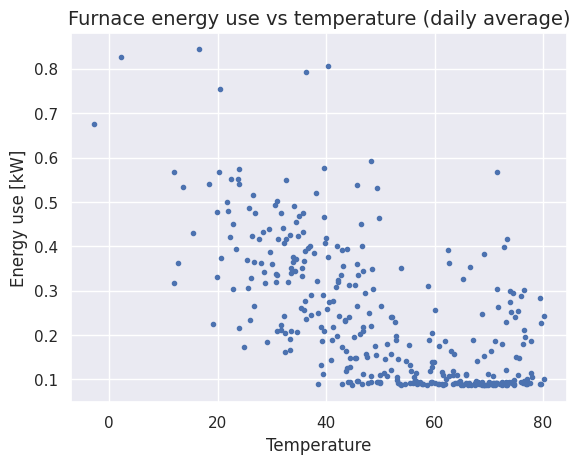

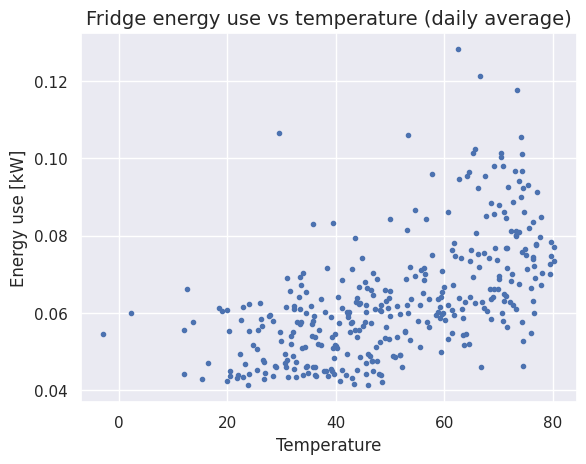

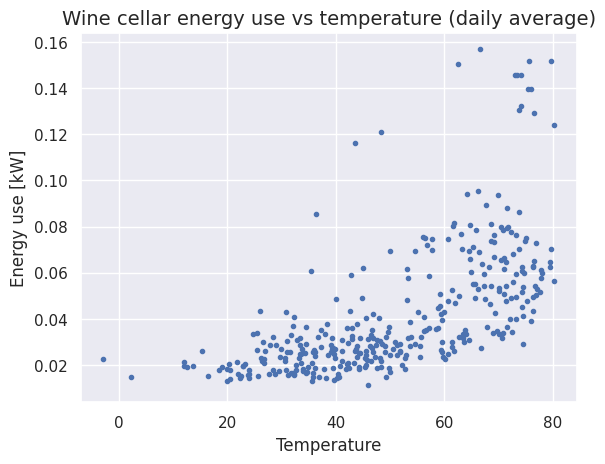

In [54]:
# scatterplots

ax1 = df_appliances.plot(x="temperature", y="Furnace", style='.',legend=False)

plt.xlabel("Temperature")
plt.ylabel("Energy use [kW]")

plt.title('Furnace energy use vs temperature (daily average)',fontsize = 14)

ax2=df_appliances.plot(x="temperature", y="Fridge", style='.',legend=False)

plt.xlabel("Temperature")
plt.ylabel("Energy use [kW]")

plt.title('Fridge energy use vs temperature (daily average)',fontsize = 14)

ax3=df_appliances.plot(x="temperature", y="Wine cellar", style='.',legend=False)

plt.xlabel("Temperature")
plt.ylabel("Energy use [kW]")

plt.title('Wine cellar energy use vs temperature (daily average)',fontsize = 14);

Heat map shows very small correlation for Solar energy generation vs Home office (-0.85) and Solar energy generation vs Furnaces (-0.083).

The scatterplots below suggest that actual correlation could be stronger but is masked by the outliers in Solar energy generation(Solar energy generation values close to 0)

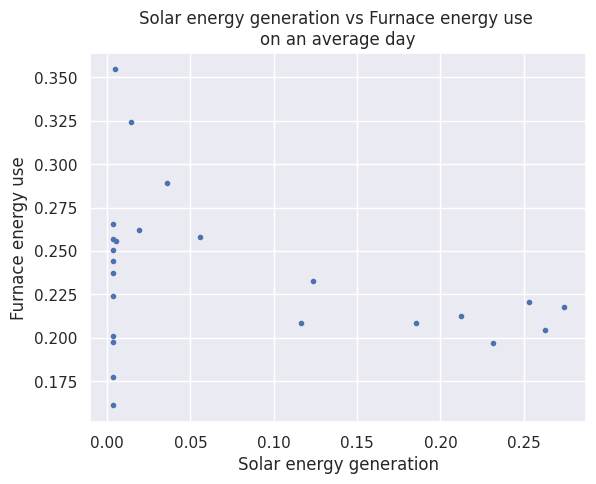

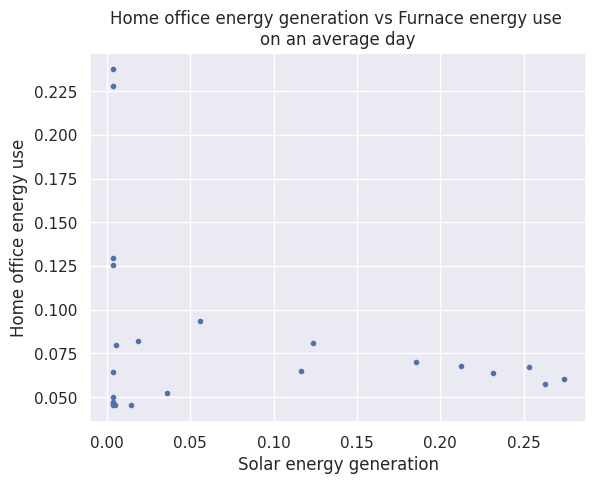

In [55]:
ax1 = df_hour.plot(x="Solar", y="Furnace", style='.',legend=False)

plt.xlabel("Solar energy generation")
plt.ylabel("Furnace energy use")

plt.title('Solar energy generation vs Furnace energy use \non an average day')

ax2=df_hour.plot(x="Solar", y="Home office", style='.',legend=False)

plt.xlabel("Solar energy generation")
plt.ylabel("Home office energy use")

plt.title('Home office energy generation vs Furnace energy use \non an average day');

## 5) Outliers 

Comparing max and mean values suggests, there are possible outliers in all columns related to Energy usage and generation.

In [56]:
df1.shape

(503910, 33)

In [57]:
df1.describe()

,House overall,Dishwasher,Home office,Fridge,Wine cellar,Garage door,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,Kitchen,year,month,day,week of year,hour,minute
count,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000,503910.0,503910.000000,503910.000000,503910.000000,503910.000000,503910.000000
mean,0.858962,0.031368,0.081287,0.063556,0.042137,0.014139,0.058530,0.015642,0.010983,0.035313,0.076229,50.741935,0.664085,9.253444,48.263382,1016.301625,6.649936,0.225873,202.356843,0.002598,38.694013,0.056453,0.235989,0.009788,2016.0,6.268381,15.411681,25.519557,11.501399,29.499107
std,1.058207,0.190951,0.104466,0.076199,0.057967,0.014292,0.202706,0.137841,0.098859,0.096056,0.128428,19.113807,0.194389,1.611186,22.027916,7.895185,3.982716,0.289892,106.520474,0.011257,19.087939,0.165836,0.273885,0.079883,0.0,3.319007,8.788936,14.471507,6.922017,17.318119
min,0.000000,0.000000,0.000083,0.000067,0.000017,0.000017,0.000000,0.000000,0.000000,0.000000,0.000000,-12.640000,0.130000,0.270000,-32.080000,986.400000,0.000000,0.000000,0.000000,0.000000,-27.240000,0.000000,0.000300,0.000000,2016.0,1.000000,1.000000,1.000000,0.000000,0.000000
25%,0.367667,0.000000,0.040383,0.005083,0.007133,0.012733,0.029833,0.000983,0.003617,0.001483,0.003367,35.770000,0.510000,9.420000,31.090000,1011.290000,3.660000,0.040000,148.000000,0.000000,24.600000,0.000000,0.085300,0.000600,2016.0,3.000000,8.000000,13.000000,6.000000,14.000000
50%,0.562333,0.000017,0.042217,0.005433,0.008083,0.012933,0.031317,0.001000,0.004000,0.001617,0.004283,50.320000,0.680000,10.000000,50.320000,1016.530000,5.930000,0.120000,208.000000,0.000000,39.030000,0.000000,0.088950,0.000750,2016.0,6.000000,15.000000,25.000000,12.000000,29.000000
75%,0.970250,0.000233,0.068283,0.125417,0.053192,0.013100,0.032883,0.001017,0.004067,0.001750,0.083917,66.260000,0.840000,10.000000,66.260000,1021.480000,8.940000,0.290000,295.000000,0.000000,54.790000,0.000000,0.219417,0.000850,2016.0,9.000000,23.000000,38.000000,18.000000,44.000000
max,14.714567,1.401767,0.971750,0.851267,1.273933,1.088983,7.027900,1.633017,1.929800,0.465217,0.613883,93.720000,0.980000,10.000000,101.120000,1042.460000,22.910000,1.000000,359.000000,0.191000,75.490000,0.840000,2.472633,2.265867,2016.0,12.000000,31.000000,53.000000,23.000000,59.000000


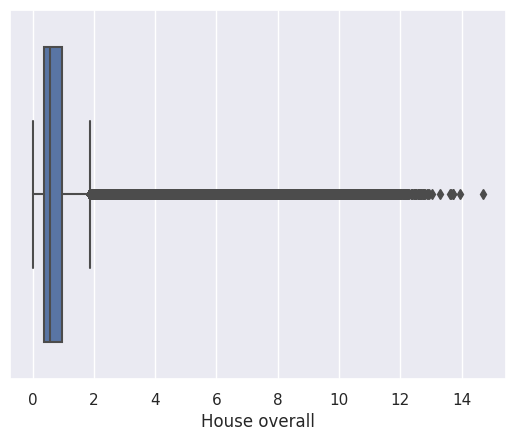

In [58]:
sns.boxplot(x=df1["House overall"]);

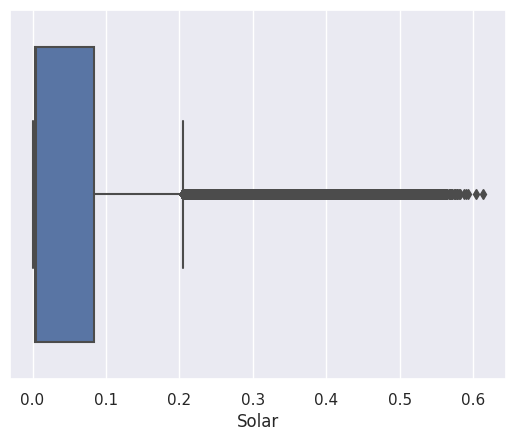

In [59]:
sns.boxplot(x=df1["Solar"]);

# PART-3 Machine Learning

# 1) Light GBM

In [ ]:
#!pip install lightgbm

In [62]:
df1.head()

,time,House overall,Dishwasher,Home office,Fridge,Wine cellar,Garage door,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,Kitchen,year,month,day,week day,week of year,hour,minute,time of day
2016-01-01 05:00:00,2016-01-01 05:00:00,0.932833,0.000033,0.442633,0.124150,0.006983,0.013083,0.031350,0.001017,0.004067,0.001517,0.003483,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.082617,0.000567,2016,1,1,Friday,53,5,0,Morning
2016-01-01 05:01:00,2016-01-01 05:01:00,0.934333,0.000000,0.444067,0.124000,0.006983,0.013117,0.031500,0.001017,0.004067,0.001650,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.084533,0.000567,2016,1,1,Friday,53,5,1,Morning
2016-01-01 05:02:00,2016-01-01 05:02:00,0.931817,0.000017,0.446067,0.123533,0.006983,0.013083,0.031517,0.001000,0.004067,0.001650,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.083017,0.000617,2016,1,1,Friday,53,5,2,Morning
2016-01-01 05:03:00,2016-01-01 05:03:00,1.022050,0.000017,0.446583,0.123133,0.006983,0.013000,0.031500,0.001017,0.004067,0.001617,0.003483,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.175417,0.000650,2016,1,1,Friday,53,5,3,Morning
2016-01-01 05:04:00,2016-01-01 05:04:00,1.139400,0.000133,0.446533,0.122850,0.006850,0.012783,0.031500,0.001017,0.004067,0.001583,0.003467,36.14,0.62,10.0,29.26,1016.91,9.18,0.12,282.0,0.0,24.4,0.0,0.300917,0.000783,2016,1,1,Friday,53,5,4,Morning


In [63]:
#resample data to get the hourly average. change week day and time of day to ints
from sklearn.preprocessing import LabelEncoder
import lightgbm as lgb
_lgbm_df = df1.resample('H').mean()
_lgbm_df.head()

,House overall,Dishwasher,Home office,Fridge,Wine cellar,Garage door,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,Kitchen,year,month,day,week of year,hour,minute
2016-01-01 05:00:00,1.044130,0.000064,0.241814,0.037861,0.063351,0.013046,0.038881,0.001042,0.021652,0.001505,0.003307,36.131000,0.619667,10.0,29.264667,1016.888,9.150333,0.141,282.100000,0.0,24.383333,0.0,0.393188,0.000821,2016.0,1.0,1.0,53.0,5.0,29.5
2016-01-01 06:00:00,0.918167,0.000099,0.043294,0.075522,0.112942,0.012836,0.039181,0.001021,0.004216,0.001618,0.003422,35.838667,0.610000,10.0,29.364667,1016.232,8.284000,0.750,284.733333,0.0,23.866000,0.0,0.456708,0.000749,2016.0,1.0,1.0,53.0,6.0,29.5
2016-01-01 07:00:00,0.714736,0.000043,0.043416,0.059486,0.007184,0.013299,0.034439,0.001014,0.004246,0.001629,0.003448,35.385000,0.613000,10.0,29.034000,1015.989,7.927000,0.750,279.400000,0.0,23.469000,0.0,0.372170,0.000726,2016.0,1.0,1.0,53.0,7.0,29.5
2016-01-01 08:00:00,0.960013,0.000138,0.065014,0.060412,0.007045,0.012925,0.034195,0.001016,0.004274,0.001634,0.003447,35.282000,0.640000,10.0,30.395333,1016.042,5.684667,0.750,265.000000,0.0,24.202667,0.0,0.616370,0.000806,2016.0,1.0,1.0,53.0,8.0,29.5
2016-01-01 09:00:00,0.639836,0.000060,0.043392,0.035106,0.007143,0.013220,0.031830,0.001014,0.004258,0.001650,0.003439,35.451667,0.641667,10.0,29.673333,1015.815,6.975000,0.625,265.500000,0.0,24.423333,0.0,0.343842,0.000796,2016.0,1.0,1.0,53.0,9.0,29.5


In [64]:
#turning week day and time of day into ints
_lgbm_df['week day'] =   LabelEncoder().fit_transform(pd.Series(_lgbm_df.index).apply(lambda x : x.day_name())).astype(np.int8)
_lgbm_df['time of day'] = LabelEncoder().fit_transform(_lgbm_df['hour'].apply(hours2timeofday)).astype(np.int8)
_lgbm_df.head()

,House overall,Dishwasher,Home office,Fridge,Wine cellar,Garage door,Barn,Well,Microwave,Living room,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,Kitchen,year,month,day,week of year,hour,minute,week day,time of day
2016-01-01 05:00:00,1.044130,0.000064,0.241814,0.037861,0.063351,0.013046,0.038881,0.001042,0.021652,0.001505,0.003307,36.131000,0.619667,10.0,29.264667,1016.888,9.150333,0.141,282.100000,0.0,24.383333,0.0,0.393188,0.000821,2016.0,1.0,1.0,53.0,5.0,29.5,0,2
2016-01-01 06:00:00,0.918167,0.000099,0.043294,0.075522,0.112942,0.012836,0.039181,0.001021,0.004216,0.001618,0.003422,35.838667,0.610000,10.0,29.364667,1016.232,8.284000,0.750,284.733333,0.0,23.866000,0.0,0.456708,0.000749,2016.0,1.0,1.0,53.0,6.0,29.5,0,2
2016-01-01 07:00:00,0.714736,0.000043,0.043416,0.059486,0.007184,0.013299,0.034439,0.001014,0.004246,0.001629,0.003448,35.385000,0.613000,10.0,29.034000,1015.989,7.927000,0.750,279.400000,0.0,23.469000,0.0,0.372170,0.000726,2016.0,1.0,1.0,53.0,7.0,29.5,0,2
2016-01-01 08:00:00,0.960013,0.000138,0.065014,0.060412,0.007045,0.012925,0.034195,0.001016,0.004274,0.001634,0.003447,35.282000,0.640000,10.0,30.395333,1016.042,5.684667,0.750,265.000000,0.0,24.202667,0.0,0.616370,0.000806,2016.0,1.0,1.0,53.0,8.0,29.5,0,2
2016-01-01 09:00:00,0.639836,0.000060,0.043392,0.035106,0.007143,0.013220,0.031830,0.001014,0.004258,0.001650,0.003439,35.451667,0.641667,10.0,29.673333,1015.815,6.975000,0.625,265.500000,0.0,24.423333,0.0,0.343842,0.000796,2016.0,1.0,1.0,53.0,9.0,29.5,0,2


In [74]:
# definition that turns the dataframe into hourly average of energy use, and split this into training, testing and validation sets
def lgbm_train(cols=['temperature','dewPoint','House overall'],trg='House overall',train_ratio=0.8,valid_ratio=0.1,test_ratio=0.1):
    #make dataframe for training
    lgbm_df = _lgbm_df[cols]
    tr,vd,te = [int(len(lgbm_df) * i) for i in [train_ratio, valid_ratio, test_ratio]]
    X_train, Y_train = lgbm_df[0:tr].drop([trg], axis=1), lgbm_df[0:tr][trg]
    X_valid, Y_valid = lgbm_df[tr:tr+vd].drop([trg], axis=1), lgbm_df[tr:tr+vd][trg]
    X_test = lgbm_df[tr+vd:tr+vd+te+2].drop([trg], axis=1)
    lgb_train = lgb.Dataset(X_train, Y_train)
    lgb_valid = lgb.Dataset(X_valid, Y_valid, reference=lgb_train)
    #model training parameters
    parameters = {  'num_leaves':200, 'min_data_per_leaf':5, 'objective' : 'regression' }

    gbm = lgb.train(parameters, lgb_train, valid_sets=[lgb_train, lgb_valid])
    #make dataframe for prediction
    pre_df = pd.DataFrame()
    pre_df[trg] = gbm.predict(X_test, num_iteration=gbm.best_iteration)
    pre_df.index = lgbm_df.index[tr+vd:tr+vd+te+2]
    return pre_df, gbm, X_train

In [75]:
#train the model using the definition created previously, with a target of house overall.
lgbmForecast_df, model, x_train = lgbm_train(\
                cols=['temperature', 'humidity', 'visibility', 'apparentTemperature',\
                       'pressure', 'windSpeed', 'cloudCover', 'windBearing', 'precipIntensity',\
                       'dewPoint', 'precipProbability','year', 'month','day', 'week day', 'week of year', \
                        'hour', 'time of day','House overall'],\
                trg='House overall',train_ratio=0.9,valid_ratio=0.09,test_ratio=0.01)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2929
[LightGBM] [Info] Number of data points in the train set: 7559, number of used features: 17
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 0.854427
[1]	training's l2: 0.599364	valid_1's l2: 0.228418
Training until validation scores don't improve for 100 rounds
[2]	training's l2: 0.519889	valid_1's l2: 0.220994
[3]	training's l2: 0.454528	valid_1's l2: 0.218952
[4]	training's l2: 0.400312	valid_1's l2: 0.214316
[5]	training's l2: 0.354967	valid_1's l2: 0.212833
[6]	training's l2: 0.315881	valid_1's l2: 0.213635
[7]	training's l2: 0.282456	valid_1's l2: 0.213527
[8]	training'

In [76]:
# dataframe of forecasts
lgbmForecast_df.head()

,House overall
2016-12-12 15:00:00,0.505491
2016-12-12 16:00:00,0.555123
2016-12-12 17:00:00,0.489452
2016-12-12 18:00:00,0.424758
2016-12-12 19:00:00,0.491963


Model evaluation

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
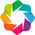

:Layout
   .Overlay.I  :Overlay
      .Curve.House_overall :Curve   [index]   (House overall)
      .Curve.Use_predicted :Curve   [index]   (House overall)
   .Overlay.II :Overlay
      .Curve.House_overall :Curve   [index]   (House overall)
      .Curve.Use_predicted :Curve   [index]   (House overall)

In [77]:
from sklearn.metrics import mean_squared_error
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

((hv.Curve(_lgbm_df['House overall'], label='House overall').opts(color='blue')\
  * hv.Curve(lgbmForecast_df['House overall'], label='use predicted').opts(color='orange', title='Result - Total Energy Consumption')).opts(legend_position='bottom') + \
 (hv.Curve(_lgbm_df['House overall'][-int(len(_lgbm_df)*0.05):], label='House overall').opts(color='blue') \
  * hv.Curve(lgbmForecast_df['House overall'], label='use predicted').opts(color='orange', title='Result Enlarged - Total Energy Consumption')).opts(legend_position='bottom'))\
    .opts(opts.Curve(xlabel="Time", yformatter='%.2fkw', width=800, height=300, show_grid=True, tools=['hover'])).opts(shared_axes=False).cols(1)

In [72]:
 ! pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 9.7 MB/s eta 0:00:00


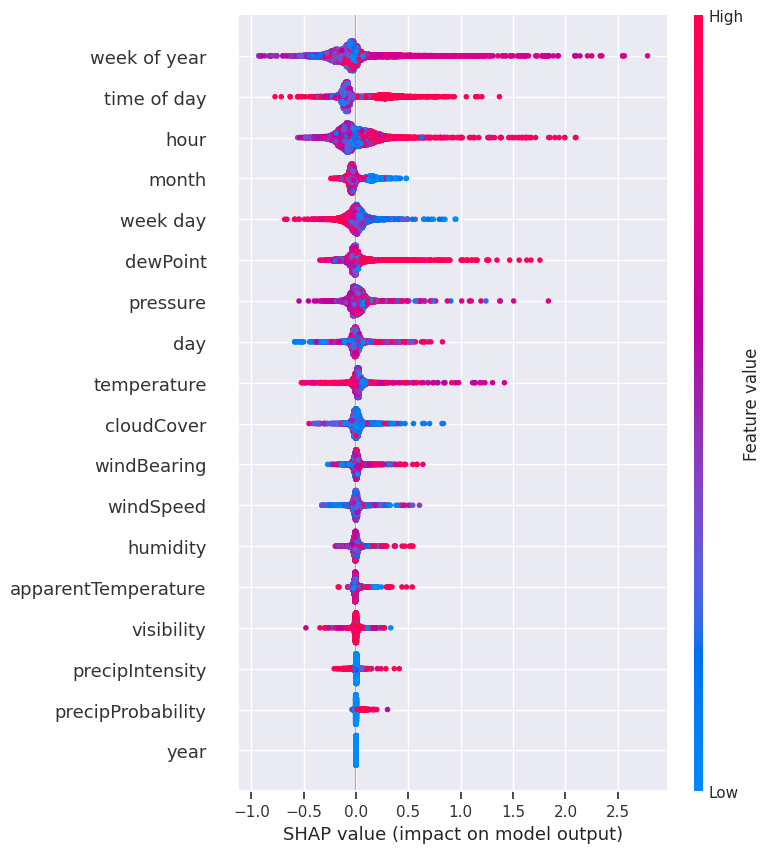

In [81]:
import shap
shap.initjs()

#calculate SHAP values this model
explainer = shap.TreeExplainer(model=model,feature_perturbation='tree_path_dependent')
shap_values = explainer.shap_values(X=x_train)

shap.summary_plot(shap_values=shap_values, features=x_train, feature_names=x_train.columns)

In [ ]:
#printing mean absolute error 
lgbm_mae = mean_squared_error(_lgbm_df['House overall'][-len(lgbmForecast_df):], lgbmForecast_df['House overall'])
print(lgbm_mae)

In [ ]:
# mean squared log error

from sklearn.metrics import mean_squared_log_error

lgbm_rmse = mean_squared_log_error(_lgbm_df['House overall'][-len(lgbmForecast_df):], lgbmForecast_df['House overall'])

print(lgbm_rmse)

In [ ]:
# mean squared error

from sklearn.metrics import mean_squared_error

mse_lgbm = mean_squared_error(_lgbm_df['House overall'][-len(lgbmForecast_df):],lgbmForecast_df['House overall'])
print(mse_lgbm)

# 2) Linear regression

#  Predicting House energy use based on Weather conditions

At the beginning of the project we chose Regression model to predict House energy use based on Temperature.

Based on domain knowledge we believed, that there should be correlation between Energy use and Weather features, which we wanted to explore.

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import metrics

#### Step1 - data engineering

In [ ]:
df4=df1.copy(deep=False)

We considered hourly-average observations for this model, to make it usable with weather forecasts predictions, which often show weather conditions as hourly average.

In [ ]:
# creating the dataset with mean values

df_regression=df4.resample(rule='H').mean()
df_regression.head()

Selecting columns with weather conditions (explanatory variables) and House overall energy use (target variable).

In [ ]:
# selecting weather features for the model

df_regression=df_regression[["temperature","humidity","visibility","apparentTemperature","pressure","windSpeed","cloudCover","windBearing","precipIntensity","dewPoint","precipProbability","House overall"]]

The weather features with multicollinearity should be excluded from the model as they may end up exaggerating the performance of the model(“How Bad Is Multicollinearity?”).

We can observe following weather features showing high correlation (above 0.5):
- temperature vs dewPoint (correlation 0.89) and apparentTemperature (0.99) - we will only use "temperature" in the model and remove "dewPoint" and "apparentTemperature"
- visibility vs humidity (-0.51) and precipProbability (-0.51) - we will only use "visibility" and remove "humidity" and "precipProbability"
- cloudCover vs precipProbability (0.51) - as above, we will remove "precipProbability"
- precipIntensity vs precipProbability (0.82) - as above, we will remove "precipProbability"

In [ ]:
# Heat map to check for correlations between weather features (checking for multicollinearity)

plt.figure(figsize=(20,10))
c= df_regression.corr()
sns.heatmap(c,cmap="BrBG",annot=True)
c

In [ ]:
# removing weather features that show multicollinearity

df_regression=df_regression.drop(["dewPoint","apparentTemperature","humidity","precipProbability"],axis=1)

df_regression.head()

Removing outliers

As observed in Part-2 above - there are possible outliers in all columns related to Energy usage and generation. Regression model is sensitive to outliers, so we remove outliers for use in this model

In [ ]:
Q1 = df_regression.quantile(0.25)
Q3 = df_regression.quantile(0.75)
IQR = Q3-Q1
df_regression = df_regression[~((df_regression < (Q1-1.5 * IQR)) |(df_regression > (Q3 + 1.5 * IQR))).any(axis=1)]

Scaling the data

We observed that Weather features use different scales. We tested the model with Standard scaler and MinMax scaler, to bring all features to the same scale, however scaling had no impact on the model performance.

In [ ]:
df_regression.describe()

We used PCA, to compress all weather features into 1 feature "Weather conditions Principal Component". PCA enabled 2-dimensional visualisation and better understanding of relationship House energy use vs Weather conditions.

In [ ]:
# as the first step, we need to drop time index, to allow column manipulation and analysis outside of time-series

df_regression =df_regression.reset_index(drop=True)

In [ ]:
# creating the dataset with Weather conditions features only

df_weather = df_regression.copy(deep=False)
df_weather=df_weather.drop(["House overall"],axis=1)

In [ ]:
df_weather.shape

In [ ]:
df_weather.head()

In [ ]:
# visualisation for PCA - we can observe that by retaining 1 Principal component we can more than 99% of Cumulative explained variance

from sklearn.decomposition import PCA

plt.rcParams["figure.figsize"] = (18,9)
pca = PCA().fit(df_weather) 
plt.plot(np.cumsum(pca.explained_variance_ratio_)) 

plt.xticks(np.arange(0, 11, step=1))
plt.axvline(x=1, color='r', linestyle='--')
plt.axhline(y=0.99, color='r', linestyle='--')

plt.title('PCA for Weather features',fontsize=16)
plt.xlabel("Number of components",fontsize=14) 
plt.ylabel("Cumulative explained variance",fontsize=14); 

In [ ]:
# implementing PCA to reduce the dataset to 1 feature

pca = PCA(1)
projected = pca.fit_transform(df_weather)

df_pca = pd.DataFrame(projected, columns =["Weather conditions PC"])

In [ ]:
df_pca.head()

In [ ]:
df_pca.shape

In [ ]:
# adding the label "House overall" back to the dataset with reduced number of features.

df_pca["House overall"] = df_regression["House overall"]

In [ ]:
df_pca.head()

In [ ]:
df_pca.shape

#### Step2 - Visualisations

Regression model can be only applied for the data that show correlation.

#### Scatterplot 

we use scatetrplot to to visualise possible relationship between House overall energy use and Weather conditions

We can observe there that in contratry to our inital beliefs there is no apparent linear relation between House overall energy use and Weather conditions

The scatterplot confirms findings in Heat map in the previous part of the project (all weather conditions had correlation less than 0.1 wit House oeverall energy use).

In [ ]:
# Scatterplot

df_pca.plot(x='Weather conditions PC', y='House overall', style='.')
plt.title('House overall energy use \nvs Weather conditions',fontsize=14)
plt.xlabel('Weather conditions (Principal Component)',fontsize=14)
plt.ylabel('Energy use [kW]',fontsize=14)
  
# adding horizontal line
plt.axhline(0, c='black', ls='--')
plt.axvline(0, c='black', ls='--')

# plt.xlim(50, 53)

plt.show()

#### Heat map 

We used Heat map to show the value of correlation between House overall energy use and Weather conditions (Principal Component)

We can see that there is a very small negative correlation (-0.015) between House overall energy use and Weather conditions.

This can be explained, as observed in Part2 - the 2 appliances with highest energy use in the house were:
1. Furnaces (39.4% of House energy use), which have dual function in the House (heating in cold temperatures and air conditioning in hot temperatures), so they would not have linear relation with Weather,
2. Home office (13.6% of House energy use), which we don't expect to be related to Weather conditions.

Both appliances consist of over 50% of House overall energy use, which explain weak correlation between House overall energy use and Weather conditions.

In [ ]:
# Heat map

plt.figure(figsize=(10,5))
c= df_pca.corr()
sns.heatmap(c,cmap="BrBG",annot=True)
c

#### Step3-Model

In [ ]:
X = df_pca.iloc[:, :1].values            # Independent variables

y = df_pca.iloc[:, 1].values              # Dependent variable

In [ ]:
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=38)


# Show the rows and columns
X.shape, y.shape, X_train.shape, X_test.shape, y_train.shape, y_test.shape

In [ ]:
# Train the model
lr2 = LinearRegression().fit(X_train, y_train)

In [ ]:
# Print the intercept and coefficients
print(lr2.intercept_)
print(lr2.coef_)

In [ ]:
# Calculate the predicted values
y_pred = lr2.predict(X_test)

y_pred

In [ ]:
 #import matplotlib.pyplot as plt
plt.scatter(y_test,y_pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y');

In [ ]:
# Display the results

# changing X_test to 1-dimensional array
X_test_1dim= np.squeeze(X_test)

# displaying the test and predicted values, with Weather PC as an index
df = pd.DataFrame({'Weather PC':X_test_1dim,'Actual': y_test, 'Predicted': y_pred})
df=df.set_index("Weather PC")

df.head(10)

#### Model evaluation

Regression model shows low Mean squared error. 


Despite low Mean squared error, Regression Model Accuracy score 0% represents a model that does not explain any of the variation in the response variable around its mean. The mean of the dependent variable predicts the dependent variable as well as the regression model (Frost).

In [ ]:
#k fold cross validation
from sklearn.model_selection import cross_val_score

cvs = cross_val_score(estimator = lr2 , X = X_train, y = y_train, cv = 10)
print(cvs, "\n Mean Accuracy :", cvs.mean(), "\nStandard Deviation :", cvs.std())

In [ ]:
# mean squared error

from sklearn.metrics import mean_squared_error

mse_regr2 = mean_squared_error(y_test,y_pred)
print(mse_regr2)

In [ ]:
print("Model Accuracy score on test set : {: .2f}".format(lr2.score(X_test, y_test)))
print("Model Accuracy score on training set : {: .2f}".format(lr2.score(X_train, y_train)))

# Models comparison

In [ ]:
# summary of Mean squared error for all models


mse_lgbm=0.16443904783651833
mse_regr2=0.1510292525393114

The table below shows comparison of the outcomes of the Machine learning models in this project.

In [ ]:
#creating the table with the results

from tabulate import tabulate

data = [ ["Light GBM", round(mse_lgbm,3)],
        ["Regression", round(mse_regr2,3)]]
  
#define header names
col_names = ["Machine learning Model", "Mean Squared Error"]
  
#display table
print(tabulate(data, headers=col_names))

In [ ]:
df_compare = pd.DataFrame(data)
df_compare.columns =['Model', 'Mean Squared Error']

In [ ]:
df_compare

In [ ]:
# bar chart comparing Mean Square Error

plt.figure(figsize=(10, 6))

ax=sns.barplot(x="Model",y="Mean Squared Error",data=df_compare)

plt.title('Mean Squared Error by Model',fontsize = 18)
plt.xlabel("Model",fontsize = 14)
plt.ylabel("MSE value",fontsize = 14)

plt.xticks(fontsize = 16,weight="bold")
plt.yticks(fontsize = 12);

## References

Brownlee, Jason. “How to Grid Search SARIMA Hyperparameters for Time Series Forecasting.” Machine Learning Mastery, 23 Oct. 2018, machinelearningmastery.com/how-to-grid-search-sarima-model-hyperparameters-for-time-series-forecasting-in-python/.


“Machine Learning for IoT.” Kaggle.com, www.kaggle.com/code/olivadebnath/machine-learning-for-iot. Accessed 30 Apr. 2023.


Pulagam, Sushmitha. “Time Series Forecasting Using Auto ARIMA in Python.” Medium, 27 June 2020, towardsdatascience.com/time-series-forecasting-using-auto-arima-in-python-bb83e49210cd.


“Smart Home Dataset with Weather Information.” Www.kaggle.com, www.kaggle.com/datasets/taranvee/smart-home-dataset-with-weather-information/metadata.


solaralliance. “How Do Clouds, Rain & Snow Affect Solar Panel Output?” Solar Alliance, 27 Jan. 2022, www.solaralliance.com/how-do-clouds-affect-solar-panels/#:~:text=Yes%2C%20solar%20panels%20can%20work.

Bateman, Blaine, et al. The the Supervised Learning Workshop. Packt Publishing Ltd, 28 Feb. 2020.

Chai, Wesley . “What Is Big Data Analytics and Why Is It Important?” SearchBusinessAnalytics, Dec. 2021, www.techtarget.com/searchbusinessanalytics/definition/big-data-analytics.

Chimamiwa, Gibson, et al. “Multi-Sensor Dataset of Human Activities in a Smart Home Environment.” Data in Brief, vol. 34, Feb. 2021, p. 106632, https://doi.org/10.1016/j.dib.2020.106632. Accessed 8 Mar. 2021.

Co, Microsoft. “Parameters — LightGBM 3.3.2.99 Documentation.” Lightgbm.readthedocs.io, 2023, lightgbm.readthedocs.io/en/latest/Parameters.html.

Dwivedi, Rohit. “What Is LightGBM Algorithm, How to Use It? | Analytics Steps.” Www.analyticssteps.com, www.analyticssteps.com/blogs/what-light-gbm-algorithm-how-use-it.

Ibrahim, Mostafa. “How to Use XGBoost and LGBM for Time Series Forecasting?” 365 Data Science, 14 July 2022, 365datascience.com/tutorials/python-tutorials/xgboost-lgbm/. Accessed 29 Apr. 2023.

Ke, Guolin, et al. LightGBM: A Highly Efficient Gradient Boosting Decision Tree.

Lundberg, Scott, et al. A Unified Approach to Interpreting Model Predictions. 2017.

Pace, Michele. “LightGBM for TimeSeries Forecasting.” Data Reply IT | DataTech, 19 Jan. 2022, medium.com/data-reply-it-datatech/lightgbm-for-timeseries-forecasting-408971289a12.

“Smart Home Dataset with Weather Information.” Www.kaggle.com, www.kaggle.com/datasets/taranvee/smart-home-dataset-with-weather-information/metadata. Accessed 11 Dec. 2022.

Stephanie. “Absolute Error & Mean Absolute Error (MAE).” Statistics How To, 25 Oct. 2016, www.statisticshowto.com/absolute-error/.

Team, Great Learning. “Mean Squared Error - Explained | What Is Mean Square Error?” GreatLearning Blog: Free Resources What Matters to Shape Your Career!, 8 Aug. 2020, www.mygreatlearning.com/blog/mean-square-error-explained/#:~:text=MSE%20is%20used%20to%20check.

Yıldırım, Soner. “Understanding the LightGBM.” Medium, 15 Sept. 2020, towardsdatascience.com/understanding-the-lightgbm-772ca08aabfa.

“How Bad Is Multicollinearity?” KDnuggets, www.kdnuggets.com/2019/09/multicollinearity-regression.html#:~:text=For%20some%20people%20anything%20below. Accessed 2 May 2023.

Frost, Jim. “How to Interpret R-Squared in Regression Analysis.” Statistics by Jim, Jim Frost, 2018, statisticsbyjim.com/regression/interpret-r-squared-regression/.